# RL Project Final Submission

# Installing Necessary Libs

In [ ]:
!pip install gym
!pip install gym_anytrading
!pip install stable-baselines3[extra]
!pip install plotly

# Importing Libs

In [151]:
from stable_baselines3.ppo.policies import MlpPolicy
from stable_baselines3 import A2C, PPO, DQN
from stable_baselines3.common.evaluation import evaluate_policy
from stable_baselines3.common.env_util import make_vec_env
import numpy as np
from matplotlib import pyplot as plt
from gym_anytrading.envs import TradingEnv, ForexEnv, StocksEnv, Actions, Positions
import tensorflow as tf
import gymnasium as gym
import gym_anytrading
from tensorflow.keras.layers import LSTM, Dense, Input, GRU, Dropout
from tensorflow.keras.models import Model
from tqdm import tqdm
from sklearn.preprocessing import MinMaxScaler
import plotly.graph_objs as go
import plotly.subplots as subplots
import pandas as pd
from plotly.subplots import make_subplots
import warnings
warnings.filterwarnings('ignore')
tf.get_logger().setLevel('ERROR')


In [107]:
np.random.seed(2)

# Dataset And Env Prep

## Importing Dataset

In [25]:
df = pd.read_csv('Apple History.csv')
df = df.iloc[::-1].reset_index(drop=True)
df = df.set_index('Date')

df_Train = df[:1500].copy().astype('float64')
df_Test = df[1401:].copy().astype('float64')

print(df_Train.head())
print(df_Test.head())

            Close      Volume  Open  High   Low
Date                                           
03/28/2014   3.88  13183890.0  3.93  3.97  3.87
03/31/2014   4.01  15380930.0  3.93  4.02  3.90
04-01-2014   4.07  18711230.0  4.04  4.10  4.02
04-02-2014   4.06  14834590.0  4.12  4.12  4.06
04-03-2014   4.00  16780420.0  4.07  4.10  3.97
            Close      Volume   Open   High    Low
Date                                              
10/21/2019  32.03  52648070.0  31.50  32.26  31.41
10/22/2019  31.51  36860310.0  32.06  32.15  31.50
10/23/2019  31.36  26858110.0  31.09  31.65  30.83
10/24/2019  31.72  28448980.0  31.58  31.86  31.34
10/25/2019  32.71  45368840.0  31.90  32.86  31.83


## Normalizing Dataset

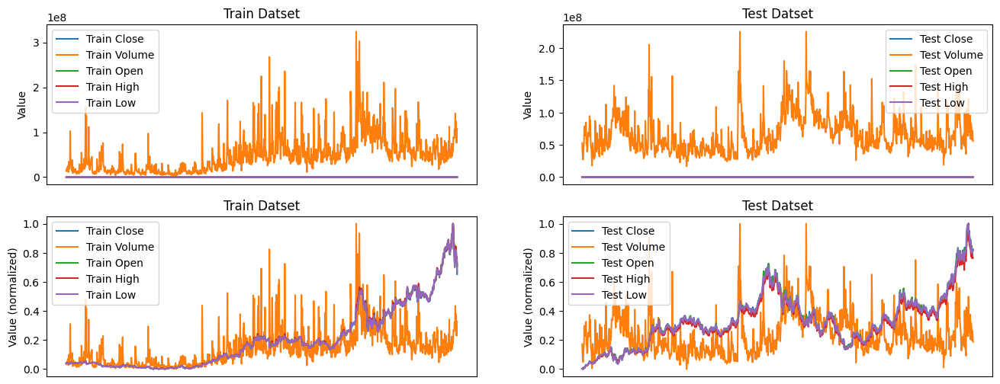

In [26]:
plt.figure(figsize=(16, 6))

plt.subplot(2,2,1)
for column in df_Train.columns:
    plt.plot(df_Train.index, df_Train[column], label=f'Train {column}')
plt.title('Train Datset')
plt.xlabel('Time Step')
plt.ylabel('Value')
plt.legend()
ax = plt.gca()
ax.get_xaxis().set_visible(False)

plt.subplot(2,2,2)
for column in df_Test.columns:
    plt.plot(df_Test.index, df_Test[column], label=f'Test {column}')
plt.title('Test Datset')
plt.xlabel('Time Step')
plt.ylabel('Value')
plt.legend()
ax = plt.gca()
ax.get_xaxis().set_visible(False)

scaler1 = MinMaxScaler()
df_Train_n = scaler1.fit_transform(df_Train)
df_Train_n = pd.DataFrame(df_Train_n, columns=df_Train.columns, index=df_Train.index)

scaler2 = MinMaxScaler()
df_Test_n = scaler2.fit_transform(df_Test)
df_Test_n = pd.DataFrame(df_Test_n, columns=df_Test.columns, index=df_Test.index)

plt.subplot(2,2,3)
for column in df_Test_n.columns:
    plt.plot(df_Train_n.index, df_Train_n[column], label=f'Train {column}')
plt.title('Train Datset')
plt.xlabel('Time Step')
plt.ylabel('Value (normalized)')
plt.legend()
ax = plt.gca()
ax.get_xaxis().set_visible(False)

plt.subplot(2,2,4)
for column in df_Test_n.columns:
    plt.plot(df_Test_n.index, df_Test_n[column], label=f'Test {column}')
plt.title('Test Datset')
plt.xlabel('Time Step')
plt.ylabel('Value (normalized)')
plt.legend()
ax = plt.gca()
ax.get_xaxis().set_visible(False)

plt.show()

## Defining functions to create env from base env

In [27]:
def my_process_data(df, df_n, window_size, frame_bound):
    start = frame_bound[0] - window_size
    end = frame_bound[1]
    prices = df.loc[:, 'Close'].to_numpy()[start:end]
    signal_features = df_n.loc[:, ['Close', 'Open', 'High', 'Low', 'Volume']].to_numpy()[start:end]
    return prices, signal_features


class MyStocksEnv(StocksEnv):
    def __init__(self, prices, signal_features, **kwargs):
        self._prices = prices
        self._signal_features = signal_features
        super().__init__(**kwargs)

    def _process_data(self):
        return self._prices, self._signal_features


def create_env(prices, signal_features, df, start_index, end_index, window_size):
    env = MyStocksEnv(prices, signal_features, df=df, window_size=window_size, frame_bound=(start_index, end_index))
    env.trade_fee = 0
    return env

def env_maker(prices, signal_features, df, start_index, end_index, window_size):
    return create_env(prices, signal_features, df, start_index, end_index, window_size)

## Creating test and train Envs

### Envs for baseline model

#### Train Env





In [28]:
prices_train, signal_features_train = my_process_data(df=df_Train, df_n=df_Train_n, window_size=100, frame_bound=(100, len(df_Train_n)))
env_train_b = make_vec_env(lambda: env_maker(prices_train, signal_features_train, df_Train, 100, len(df_Train), 100), n_envs=10)

#### Test Env





In [29]:
prices_test, signal_features_test = my_process_data(df=df_Test, df_n=df_Test_n, window_size=100, frame_bound=(100, len(df_Test_n)))
env_test_b = env_maker(prices_test, signal_features_test, df_Test, 100, len(df_Test), 100)

### Envs for custom model

#### Train Env

In [33]:
prices_train, signal_features_train = my_process_data(df=df_Train, df_n=df_Train_n, window_size=100, frame_bound=(100, len(df_Train_n)))
env_train = MyStocksEnv(prices_train, signal_features_train, df=df_Train, window_size=100, frame_bound=(100, len(df_Train_n)))
env_train.trade_fee = 0

print("custom_env information:")
print("> shape:", env_train.unwrapped.shape)
print("> df.shape:", env_train.unwrapped.df.shape)
print("> prices.shape:", env_train.unwrapped.prices.shape)
print("> signal_features.shape:", env_train.unwrapped.signal_features.shape)
print("> Action Space:", env_train.unwrapped.action_space)

custom_env information:
> shape: (100, 5)
> df.shape: (1500, 5)
> prices.shape: (1500,)
> signal_features.shape: (1500, 5)
> Action Space: Discrete(2)


#### Test Env





In [32]:
prices_test, signal_features_test = my_process_data(df=df_Test, df_n=df_Test_n, window_size=100, frame_bound=(100, len(df_Test_n)))
env_test = MyStocksEnv(prices_test, signal_features_test, df=df_Test, window_size=100, frame_bound=(100, len(df_Test_n)))
env_test.trade_fee = 0

print("custom_env information:")
print("> shape:", env_test.unwrapped.shape)
print("> df.shape:", env_test.unwrapped.df.shape)
print("> prices.shape:", env_test.unwrapped.prices.shape)
print("> signal_features.shape:", env_test.unwrapped.signal_features.shape)
print("> Action Space:", env_test.unwrapped.action_space)

custom_env information:
> shape: (100, 5)
> df.shape: (1116, 5)
> prices.shape: (1116,)
> signal_features.shape: (1116, 5)
> Action Space: Discrete(2)


# Training and Testing Baseline Model

## Defining Model Evlauation Function

In [69]:
def plot_eval_results(results, df_test, title, xlabel, ylabel):
    data = np.array(list(results.values()))
    means = np.mean(data, axis=0)
    stds = np.std(data, axis=0)
    
    x_range = list(range(len(means)))

    trace1 = go.Scatter(
        x=x_range, 
        y=means, 
        mode='markers',
        name='Mean Values',
        marker=dict(color='red'),
        error_y=dict(type='data', array=stds, visible=True, color='blue', thickness=1.5)
    )

    fig = make_subplots(rows=2, cols=1, shared_xaxes=True, vertical_spacing=0.1)
    fig.add_trace(trace1, row=1, col=1)

    for index, result_set in enumerate(data):
        trace2 = go.Scatter(
            x=x_range,
            y=result_set,
            mode='lines',
            name=f'Result Set {index + 1}'
        )
        fig.add_trace(trace2, row=2, col=1)


    fig.update_layout(
        xaxis1=dict(title=xlabel, tickangle=-45),
        yaxis1=dict(title=ylabel),
        xaxis2=dict(title='Time Step'),
        yaxis2=dict(title='Quality'),
        showlegend=True,
        title_text=title
    )

    fig.show()

def evla_baseline_model(env, model):
  result = {0: [],1: [], 2: [], 3: [], 4: [], 5: [], 6: [], 7: [], 8: [], 9: []}
  for i in range(10):
    obs, *info = env.reset()
    total_reward = 0
    while True:
        obs_array = obs if isinstance(obs, np.ndarray) else obs[0]
        obs_array = obs_array[np.newaxis, ...]
        action, _ = model.predict(obs_array)
        obs, reward, done, t, info = env.step(action)
        total_reward += reward
        result[i].append(total_reward)
        if done or t:
            break
    plt.figure(figsize=(30, 5))
    env.render_all()
    plt.show()

  plot_eval_results(result, df_Test_n, title='Quality Plot', xlabel='Time Step', ylabel='Quality')

## Training Baseline Model

In [35]:
baseline_model = PPO(MlpPolicy, env_train_b, verbose=1)
baseline_model.learn(total_timesteps=500000, progress_bar=True)

Using cpu device
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 1.4e+03  |
|    ep_rew_mean     | 26.9     |
| time/              |          |
|    fps             | 10896    |
|    iterations      | 1        |
|    time_elapsed    | 1        |
|    total_timesteps | 20480    |
---------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 1.4e+03     |
|    ep_rew_mean          | 21.9        |
| time/                   |             |
|    fps                  | 2328        |
|    iterations           | 2           |
|    time_elapsed         | 17          |
|    total_timesteps      | 40960       |
| train/                  |             |
|    approx_kl            | 0.012530637 |
|    clip_fraction        | 0.0272      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.684      |
|    explained_variance   | -0.0316     |
|    learning

## Testing Baseline Model

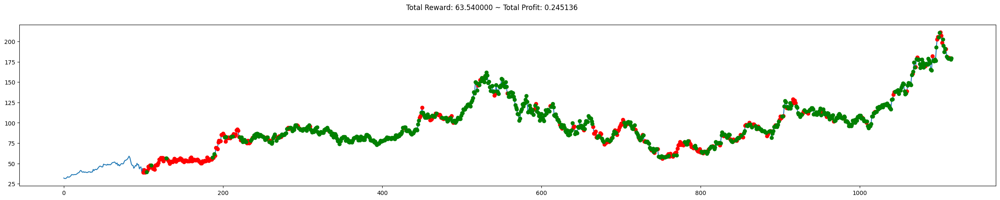

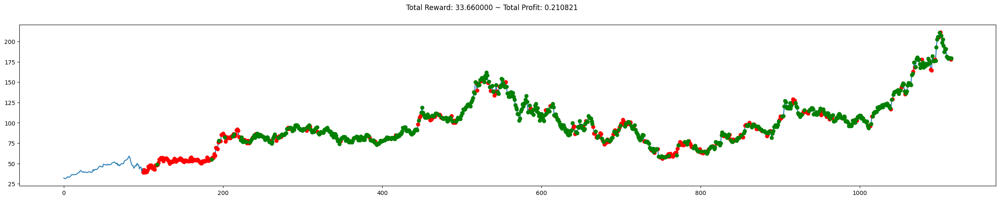

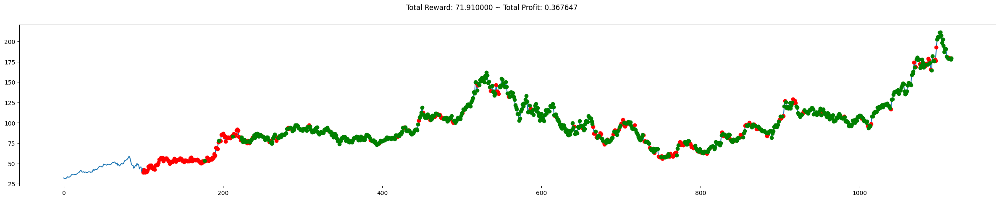

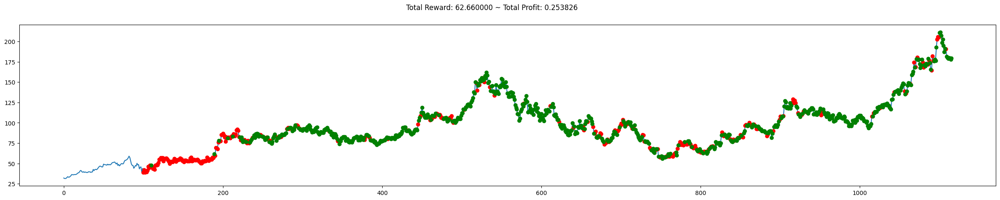

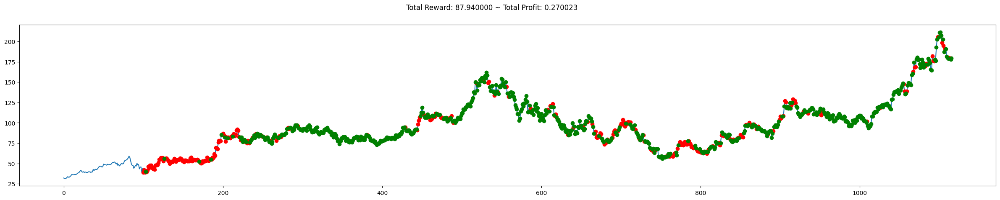

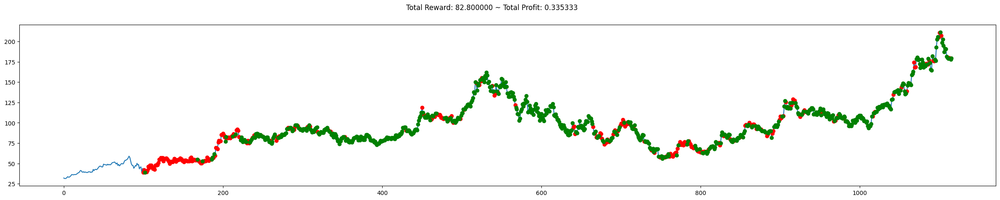

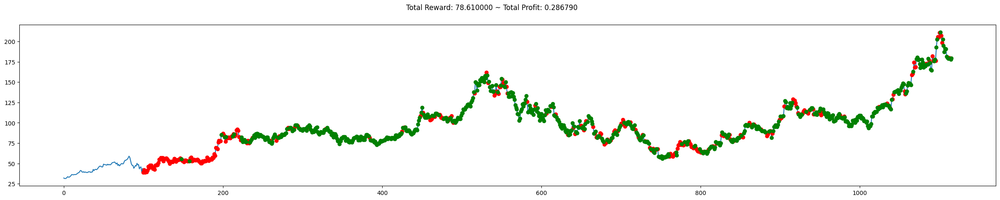

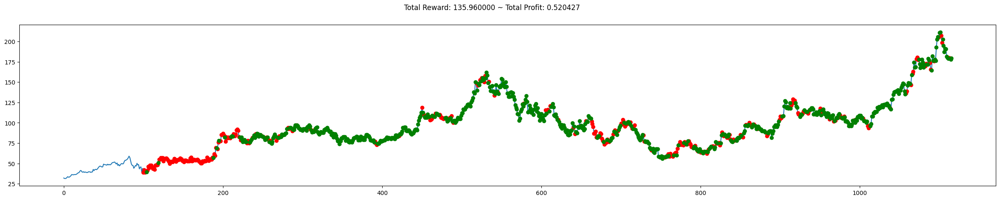

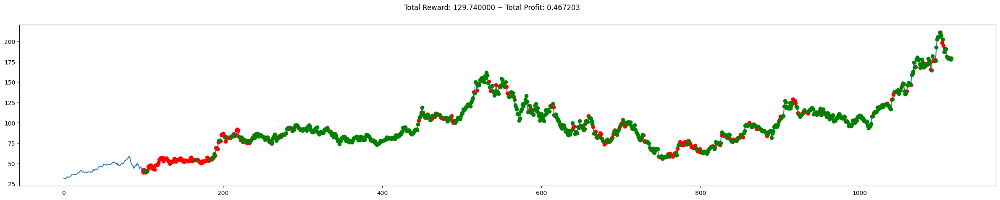

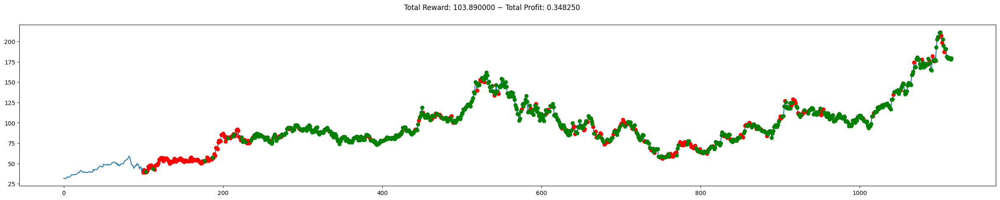

In [124]:
evla_baseline_model(env_test_b, baseline_model)

# Training and Testing Custom Model

## Defining Model Evlauation Function

In [70]:
def plot_eval_results(results, df_test, title, xlabel, ylabel):
    data = np.array(list(results.values()))
    means = np.mean(data, axis=0)
    stds = np.std(data, axis=0)
    
    x_range = list(range(len(means)))

    trace1 = go.Scatter(
        x=x_range, 
        y=means, 
        mode='markers',
        name='Mean Values',
        marker=dict(color='red'),
        error_y=dict(type='data', array=stds, visible=True, color='blue', thickness=1.5)
    )

    fig = make_subplots(rows=2, cols=1, shared_xaxes=True, vertical_spacing=0.1)
    fig.add_trace(trace1, row=1, col=1)

    for index, result_set in enumerate(data):
        trace2 = go.Scatter(
            x=x_range,
            y=result_set,
            mode='lines',
            name=f'Result Set {index + 1}'
        )
        fig.add_trace(trace2, row=2, col=1)


    fig.update_layout(
        xaxis1=dict(title=xlabel, tickangle=-45),
        yaxis1=dict(title=ylabel),
        xaxis2=dict(title='Time Step'),
        yaxis2=dict(title='Quality'),
        showlegend=True,
        title_text=title
    )

    fig.show()


def evla_custom_model(env, actor, num_eval=10):
  result = {}
  for i in tqdm(range(num_eval)):
    state, _ = env.reset()
    total_reward = 0
    done = False
    result[i] = []
    while not done:
        state = np.expand_dims(state, axis=0)
        logits = actor(state)
        action_probs = tf.nn.softmax(logits, axis=-1)
        action_probs = tf.reduce_sum(action_probs, axis=0)
        action_probs = tf.reduce_sum(action_probs, axis=0)
        action_probs = action_probs.numpy()
        action_probs /= np.sum(action_probs)
        action = action = np.random.choice(env.action_space.n, p=action_probs)
        next_state, reward, truncated, done, info = env.step(action)
        total_reward += reward
        result[i].append(total_reward)
        state = next_state

        if done or truncated:
            break

    print(f"Total reward accumulated during the test: {total_reward}")
    plt.figure(figsize=(30, 5))
    env.render_all()
    plt.show()

  plot_eval_results(result, df_Test_n, title='Quality Plot', xlabel='Time Step', ylabel='Quality')

## Defining Actor Network, Crtic Network and PPO Algorithm

In [128]:
## Actor Network
inputs = Input(shape=(None, signal_features_train.shape[-1]))
lstm = LSTM(128, return_sequences=True)(inputs)
lstm = LSTM(256, return_sequences=True)(lstm)
dense = Dense(256, activation='relu')(lstm)
dense = Dense(128, activation='relu')(dense)
dense = Dense(128, activation='relu')(dense)
logits = Dense(env_train.action_space.n, activation='sigmoid')(dense)
actor = Model(inputs=inputs, outputs=logits)

## Critic Network
inputs = Input(shape=(None, signal_features_train.shape[-1]))
lstm = LSTM(128, return_sequences=True)(inputs)
lstm = LSTM(256, return_sequences=True)(lstm)
dense = Dense(256, activation='relu')(lstm)
dense = Dense(128, activation='relu')(dense)
dense = Dense(128, activation='relu')(dense)
values = Dense(1, activation='sigmoid')(dense)
critic = Model(inputs=inputs, outputs=values)

## PPO Algorithm
optimizer = tf.keras.optimizers.Adam(learning_rate=0.001)
huber_loss = tf.keras.losses.Huber()
entropy_loss = tf.keras.losses.CategoricalCrossentropy(from_logits=True)

## Defining Custom training loop

In [129]:
def train_ppo(env, actor, critic, num_episodes):
    total_reward = []
    for episode in tqdm(range(num_episodes)):
        state, info = env.reset()
        episode_rewards = []
        states, actions, rewards, values, dones, old_probs = [], [], [], [], [], []

        while True:
            state = np.expand_dims(state, axis=0)
            logits = actor(state)
            action_probs = tf.nn.softmax(logits, axis=-1)
            action_probs = tf.reduce_sum(action_probs, axis=0)
            action_probs = tf.reduce_sum(action_probs, axis=0)
            action_probs = action_probs.numpy()
            action_probs /= np.sum(action_probs)


            action = np.random.choice(env.action_space.n, p=action_probs)
            chosen_prob = action_probs[action]

            value = critic(state)
            next_state, reward, truncated, done, info = env.step(action)

            states.append(state[0])
            actions.append(action)
            rewards.append(reward)
            values.append(value[0][0])
            dones.append(done or truncated)
            old_probs.append([chosen_prob, 1-chosen_prob])

            state = next_state
            episode_rewards.append(reward)

            if done or truncated:
                break

        returns, advantages = calculate_returns_and_advantages(rewards, values, dones)

        actions = tf.convert_to_tensor(actions, dtype=tf.int32)
        old_probs = tf.convert_to_tensor(old_probs, dtype=tf.float32)
        advantages = tf.convert_to_tensor(advantages, dtype=tf.float32)
        returns = tf.convert_to_tensor(returns, dtype=tf.float32)
        values = tf.convert_to_tensor(values, dtype=tf.float32)

        with tf.GradientTape() as tape:
            new_logits = actor(tf.convert_to_tensor(states))
            new_probs = tf.nn.softmax(new_logits, axis=-1)
            new_probs = tf.gather_nd(new_probs, tf.stack([tf.range(actions.shape[0]), actions], axis=1))
            loss = ppo_loss(old_probs, values, returns, actions, advantages, new_probs)

        gradients = tape.gradient(loss, actor.trainable_variables + critic.trainable_variables)
        optimizer.apply_gradients(zip(gradients, actor.trainable_variables + critic.trainable_variables))
        total_reward.append(sum(episode_rewards))
        print(f"Episode: {episode}, Total Reward: {sum(episode_rewards)}, loss: {loss}")
    print("total_reward: ",total_reward)
    return actor

def ppo_loss(old_probs, values, returns, actions, advantages, new_probs):
    old_probs = tf.reshape(old_probs, new_probs.shape)
    ratio = new_probs / old_probs
    p1 = ratio * tf.expand_dims(advantages, axis=-1)
    p2 = tf.clip_by_value(ratio, 2 - 0.4, 2 + 0.4) * tf.expand_dims(advantages, axis=-1)
    surrogate_loss = -tf.reduce_mean(tf.minimum(p1, p2))
    value_loss = huber_loss(values, returns)
    total_loss = surrogate_loss + 0.5 * value_loss
    return total_loss

def calculate_returns_and_advantages(rewards, values, dones, discount_factor=0.99, lambda_=0.95):
    num_steps = len(rewards)
    returns = np.zeros(num_steps)
    advantages = np.zeros(num_steps)
    next_value = 0
    gae = 0

    for t in reversed(range(num_steps)):
        if dones[t]:
            delta = rewards[t] - values[t]
            next_value = 0
            gae = 0
        else:
            delta = rewards[t] + discount_factor * next_value - values[t]
        gae = delta + discount_factor * lambda_ * gae
        advantages[t] = gae
        returns[t] = gae + values[t]
        next_value = values[t]

    return returns, advantages

## Training Custom Model

In [130]:
train_ppo(env_train, actor, critic, num_episodes=20)

  5%|▌         | 1/20 [00:41<13:14, 41.79s/it]

Episode: 0, Total Reward: 17.149999999999988, loss: 0.08424423635005951


 10%|█         | 2/20 [01:22<12:21, 41.19s/it]

Episode: 1, Total Reward: 24.390000000000043, loss: 0.05104263126850128


 15%|█▌        | 3/20 [02:03<11:38, 41.10s/it]

Episode: 2, Total Reward: 15.940000000000001, loss: 0.16488076746463776


 20%|██        | 4/20 [02:43<10:52, 40.80s/it]

Episode: 3, Total Reward: 16.119999999999997, loss: 0.12073658406734467


 25%|██▌       | 5/20 [03:29<10:35, 42.39s/it]

Episode: 4, Total Reward: 35.71999999999998, loss: -0.03404232859611511


 30%|███       | 6/20 [04:22<10:45, 46.13s/it]

Episode: 5, Total Reward: 25.439999999999927, loss: 0.08061368763446808


 35%|███▌      | 7/20 [05:13<10:19, 47.65s/it]

Episode: 6, Total Reward: 10.88000000000001, loss: 0.2752484977245331


 40%|████      | 8/20 [05:53<09:04, 45.40s/it]

Episode: 7, Total Reward: -0.7300000000000075, loss: 0.34092482924461365


 45%|████▌     | 9/20 [06:34<08:04, 44.02s/it]

Episode: 8, Total Reward: 9.990000000000036, loss: 0.14863404631614685


 50%|█████     | 10/20 [07:15<07:08, 42.90s/it]

Episode: 9, Total Reward: 24.350000000000016, loss: 0.029892131686210632


 55%|█████▌    | 11/20 [07:55<06:20, 42.24s/it]

Episode: 10, Total Reward: 12.029999999999966, loss: 0.20940054953098297


 60%|██████    | 12/20 [08:36<05:33, 41.75s/it]

Episode: 11, Total Reward: 17.030000000000015, loss: 0.13634765148162842


 65%|██████▌   | 13/20 [09:17<04:51, 41.59s/it]

Episode: 12, Total Reward: 10.830000000000005, loss: 0.25481414794921875


 70%|███████   | 14/20 [10:00<04:11, 41.88s/it]

Episode: 13, Total Reward: 12.69000000000003, loss: 0.2835540473461151


 75%|███████▌  | 15/20 [10:44<03:32, 42.46s/it]

Episode: 14, Total Reward: 14.72000000000002, loss: 0.20693817734718323


 80%|████████  | 16/20 [11:31<02:55, 43.85s/it]

Episode: 15, Total Reward: 25.070000000000007, loss: 0.013999253511428833


 85%|████████▌ | 17/20 [12:16<02:12, 44.16s/it]

Episode: 16, Total Reward: 23.159999999999982, loss: 0.054656192660331726


 90%|█████████ | 18/20 [12:57<01:26, 43.21s/it]

Episode: 17, Total Reward: 23.160000000000025, loss: 0.0007896125316619873


 95%|█████████▌| 19/20 [13:37<00:42, 42.47s/it]

Episode: 18, Total Reward: 16.14, loss: 0.08215644210577011


100%|██████████| 20/20 [14:18<00:00, 42.95s/it]

Episode: 19, Total Reward: 16.340000000000018, loss: 0.13674119114875793
total_reward:  [17.149999999999988, 24.390000000000043, 15.940000000000001, 16.119999999999997, 35.71999999999998, 25.439999999999927, 10.88000000000001, -0.7300000000000075, 9.990000000000036, 24.350000000000016, 12.029999999999966, 17.030000000000015, 10.830000000000005, 12.69000000000003, 14.72000000000002, 25.070000000000007, 23.159999999999982, 23.160000000000025, 16.14, 16.340000000000018]


## Testing Custom Model

  0%|          | 0/10 [00:00<?, ?it/s]

Total reward accumulated during the test: 142.59


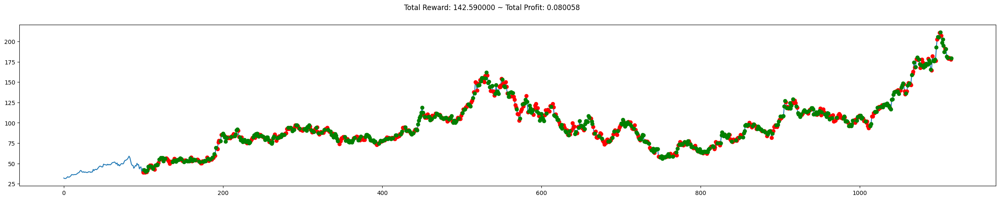

 10%|█         | 1/10 [00:15<02:18, 15.38s/it]

Total reward accumulated during the test: 160.41000000000003


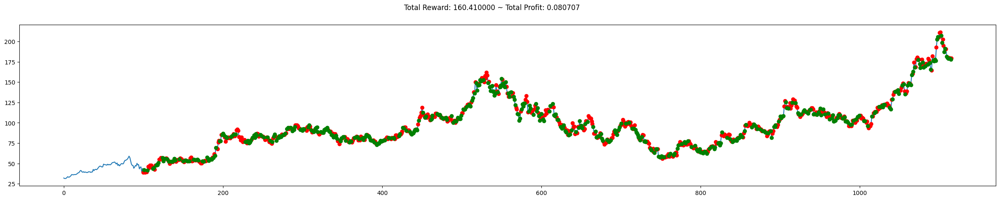

 20%|██        | 2/10 [00:30<02:02, 15.27s/it]

Total reward accumulated during the test: 38.58999999999995


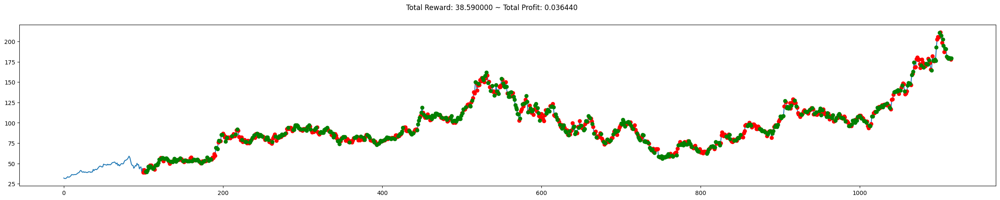

 30%|███       | 3/10 [00:45<01:46, 15.16s/it]

Total reward accumulated during the test: 57.579999999999956


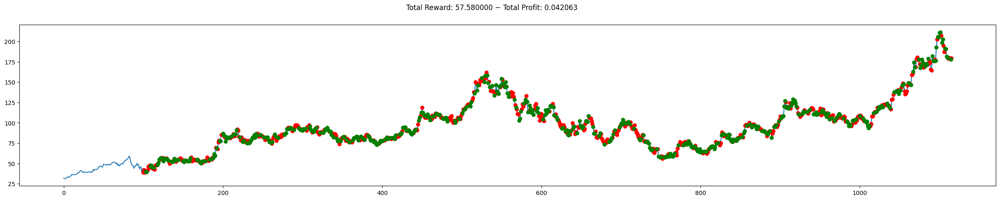

 40%|████      | 4/10 [01:00<01:30, 15.09s/it]

Total reward accumulated during the test: 7.689999999999927


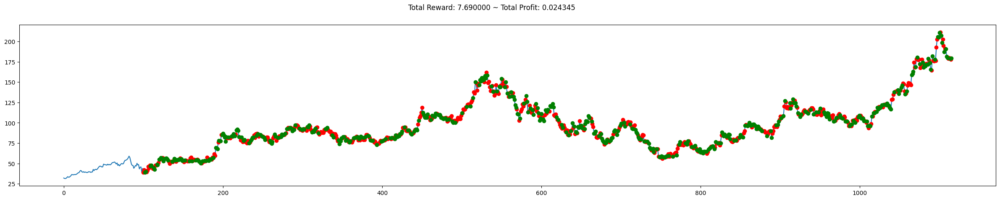

 50%|█████     | 5/10 [01:15<01:14, 14.99s/it]

Total reward accumulated during the test: 88.33000000000007


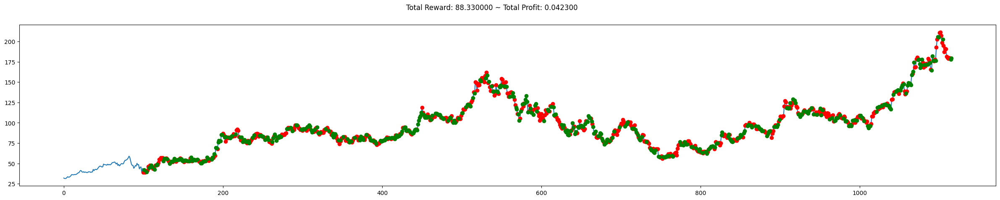

 60%|██████    | 6/10 [01:30<00:59, 14.93s/it]

Total reward accumulated during the test: 74.64999999999998


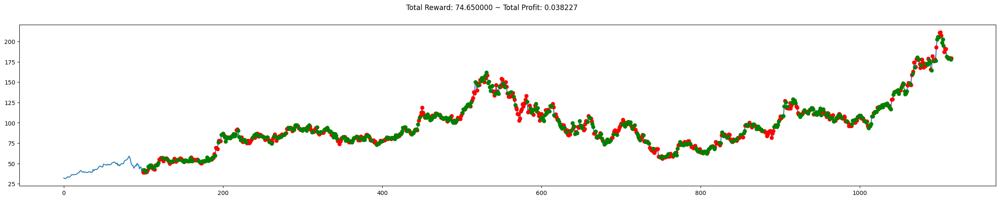

 70%|███████   | 7/10 [01:44<00:44, 14.84s/it]

Total reward accumulated during the test: 122.49000000000007


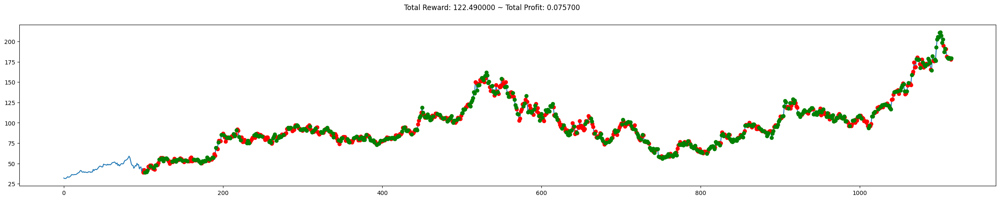

 80%|████████  | 8/10 [01:59<00:29, 14.83s/it]

Total reward accumulated during the test: 23.67000000000005


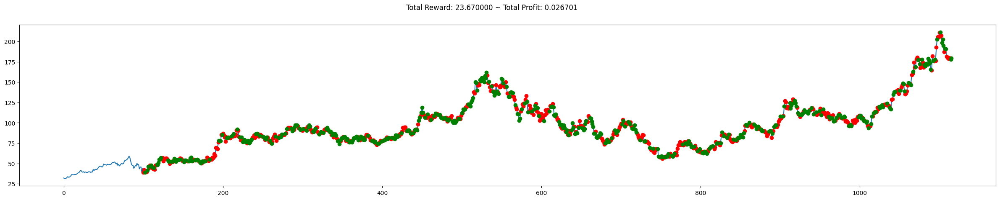

 90%|█████████ | 9/10 [02:14<00:14, 14.80s/it]

Total reward accumulated during the test: 134.3800000000001


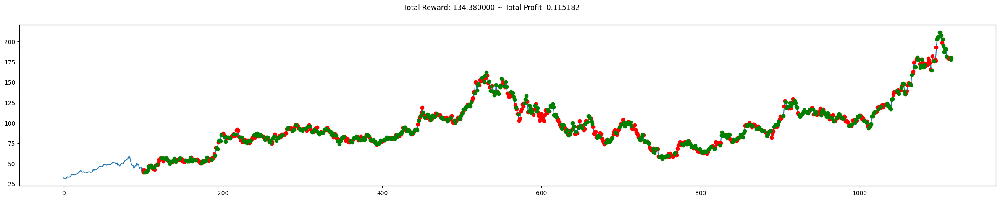

100%|██████████| 10/10 [02:29<00:00, 14.93s/it]


In [131]:
np.random.seed(99)
evla_custom_model(env_test, actor, num_eval=10)

# Modifying Custom Model Hyperparameters

* Increasing No of layers
* Increasing No of LSTM Units
* Training longer
* Training shorter

All the Hyperparameters tweaking is done on Custom Baseline model

## Increasing No of layers

### Defining Custom Model - Increasing No of layers

In [136]:
## Actor Network
inputs = Input(shape=(None, signal_features_train.shape[-1]))
lstm = LSTM(128, return_sequences=True)(inputs)
lstm = LSTM(256, return_sequences=True)(lstm)
lstm = LSTM(256, return_sequences=True)(lstm)
dense = Dense(512, activation='relu')(lstm)
dense = Dense(256, activation='relu')(dense)
dense = Dense(128, activation='relu')(dense)
logits = Dense(env_train.action_space.n, activation='sigmoid')(dense)
actor = Model(inputs=inputs, outputs=logits)

## Critic Network
inputs = Input(shape=(None, signal_features_train.shape[-1]))
lstm = LSTM(128, return_sequences=True)(inputs)
lstm = LSTM(256, return_sequences=True)(lstm)
lstm = LSTM(256, return_sequences=True)(lstm)
dense = Dense(512, activation='relu')(lstm)
dense = Dense(256, activation='relu')(dense)
dense = Dense(128, activation='relu')(dense)
values = Dense(1, activation='relu')(dense)
critic = Model(inputs=inputs, outputs=values)

## PPO Algorithm
optimizer = tf.keras.optimizers.Adam(learning_rate=0.001)
huber_loss = tf.keras.losses.Huber()
entropy_loss = tf.keras.losses.CategoricalCrossentropy(from_logits=True)

### Training Custom Model

In [137]:
train_ppo(env_train, actor, critic, num_episodes=20)

  5%|▌         | 1/20 [01:18<24:48, 78.34s/it]

Episode: 0, Total Reward: 30.299999999999997, loss: -0.1450263112783432


 10%|█         | 2/20 [02:37<23:40, 78.91s/it]

Episode: 1, Total Reward: 35.37000000000004, loss: -0.1569496989250183


 15%|█▌        | 3/20 [03:58<22:33, 79.62s/it]

Episode: 2, Total Reward: 26.059999999999985, loss: -0.07720492780208588


 20%|██        | 4/20 [05:19<21:24, 80.28s/it]

Episode: 3, Total Reward: 24.030000000000015, loss: -0.06602779030799866


 25%|██▌       | 5/20 [06:39<20:01, 80.10s/it]

Episode: 4, Total Reward: 25.64999999999998, loss: -0.12376311421394348


 30%|███       | 6/20 [08:00<18:45, 80.42s/it]

Episode: 5, Total Reward: 15.050000000000033, loss: 0.029312163591384888


 35%|███▌      | 7/20 [09:22<17:34, 81.11s/it]

Episode: 6, Total Reward: 28.89999999999999, loss: -0.028568148612976074


 40%|████      | 8/20 [10:43<16:11, 80.99s/it]

Episode: 7, Total Reward: 33.49000000000002, loss: -0.11997365951538086


 45%|████▌     | 9/20 [12:00<14:38, 79.86s/it]

Episode: 8, Total Reward: 34.319999999999936, loss: -0.13813233375549316


 50%|█████     | 10/20 [13:19<13:14, 79.41s/it]

Episode: 9, Total Reward: 24.269999999999982, loss: -0.04869282245635986


 55%|█████▌    | 11/20 [14:37<11:51, 79.03s/it]

Episode: 10, Total Reward: 43.23999999999998, loss: -0.226849764585495


 60%|██████    | 12/20 [15:55<10:30, 78.83s/it]

Episode: 11, Total Reward: 4.989999999999979, loss: 0.14541202783584595


 65%|██████▌   | 13/20 [17:16<09:14, 79.24s/it]

Episode: 12, Total Reward: 43.61999999999997, loss: -0.24533921480178833


 70%|███████   | 14/20 [18:36<07:57, 79.52s/it]

Episode: 13, Total Reward: 1.7900000000000027, loss: 0.20744219422340393


 75%|███████▌  | 15/20 [19:54<06:35, 79.06s/it]

Episode: 14, Total Reward: -6.610000000000015, loss: 0.37675637006759644


 80%|████████  | 16/20 [21:11<05:13, 78.49s/it]

Episode: 15, Total Reward: 28.959999999999987, loss: -0.057992368936538696


 85%|████████▌ | 17/20 [22:29<03:55, 78.46s/it]

Episode: 16, Total Reward: 16.850000000000012, loss: 0.004548951983451843


 90%|█████████ | 18/20 [23:45<02:35, 77.77s/it]

Episode: 17, Total Reward: 30.19, loss: -0.12001137435436249


 95%|█████████▌| 19/20 [25:02<01:17, 77.54s/it]

Episode: 18, Total Reward: 19.15, loss: 0.07621125876903534


100%|██████████| 20/20 [26:20<00:00, 79.01s/it]

Episode: 19, Total Reward: -4.259999999999998, loss: 0.2973693907260895
total_reward:  [30.299999999999997, 35.37000000000004, 26.059999999999985, 24.030000000000015, 25.64999999999998, 15.050000000000033, 28.89999999999999, 33.49000000000002, 34.319999999999936, 24.269999999999982, 43.23999999999998, 4.989999999999979, 43.61999999999997, 1.7900000000000027, -6.610000000000015, 28.959999999999987, 16.850000000000012, 30.19, 19.15, -4.259999999999998]


### Testing Custom Model

  0%|          | 0/10 [00:00<?, ?it/s]

Total reward accumulated during the test: 68.57000000000005


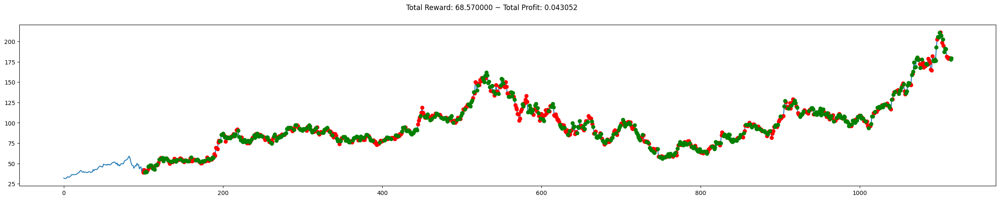

 10%|█         | 1/10 [00:28<04:20, 28.99s/it]

Total reward accumulated during the test: 111.23999999999994


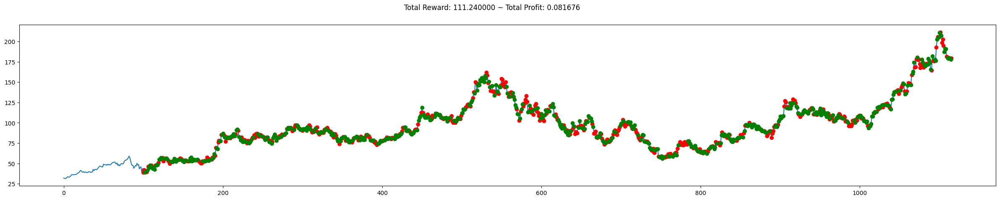

 20%|██        | 2/10 [00:57<03:48, 28.60s/it]

Total reward accumulated during the test: 125.94000000000008


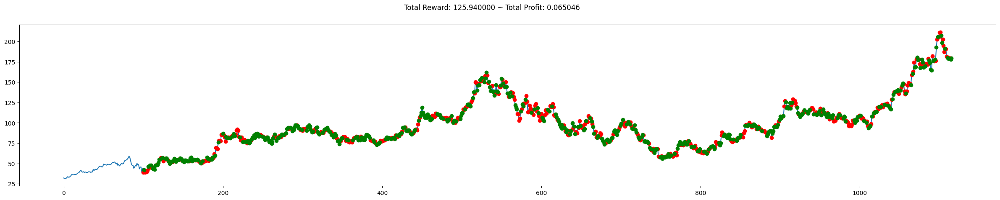

 30%|███       | 3/10 [01:25<03:18, 28.32s/it]

Total reward accumulated during the test: 73.97000000000014


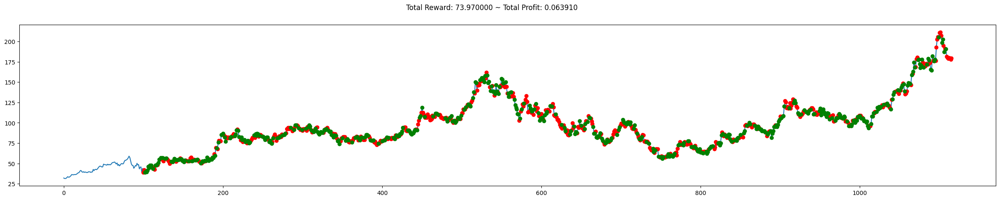

 40%|████      | 4/10 [01:54<02:51, 28.54s/it]

Total reward accumulated during the test: 74.45000000000007


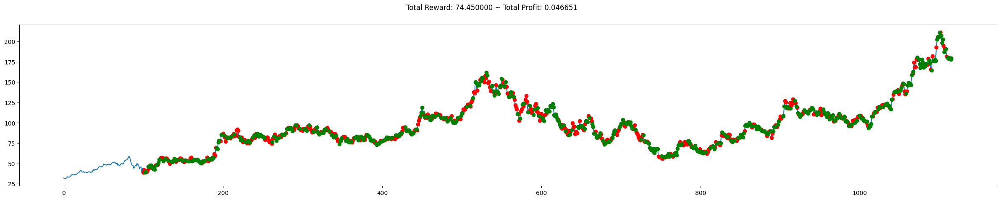

 50%|█████     | 5/10 [02:23<02:24, 28.80s/it]

Total reward accumulated during the test: 54.73000000000005


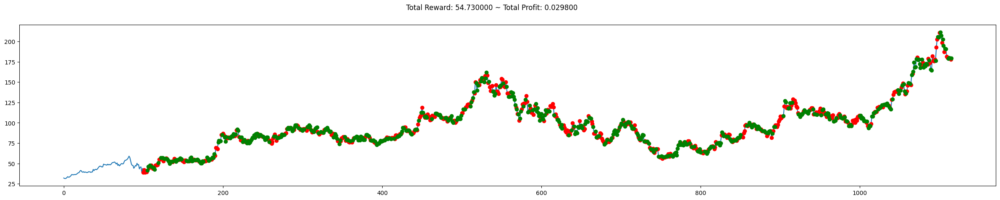

 60%|██████    | 6/10 [02:52<01:55, 28.85s/it]

Total reward accumulated during the test: 1.0299999999998946


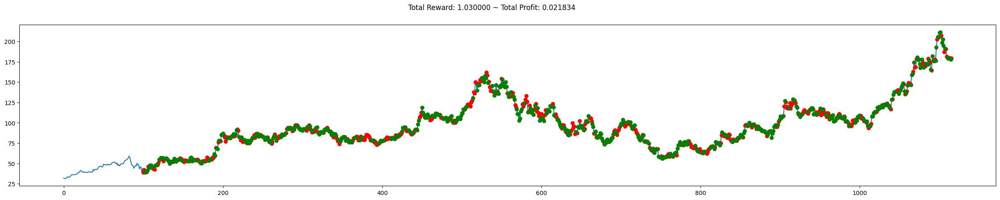

 70%|███████   | 7/10 [03:21<01:26, 28.88s/it]

Total reward accumulated during the test: -33.119999999999905


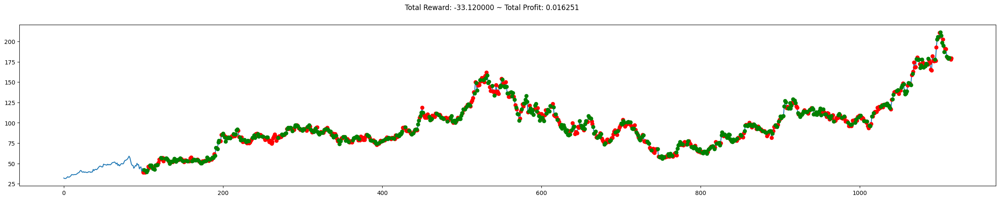

 80%|████████  | 8/10 [03:50<00:57, 28.93s/it]

Total reward accumulated during the test: 100.09999999999988


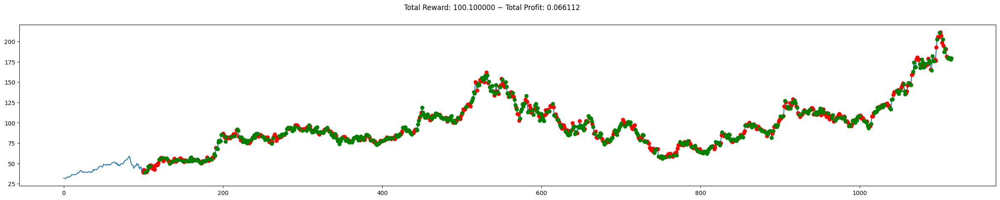

 90%|█████████ | 9/10 [04:19<00:28, 28.92s/it]

Total reward accumulated during the test: 116.72000000000017


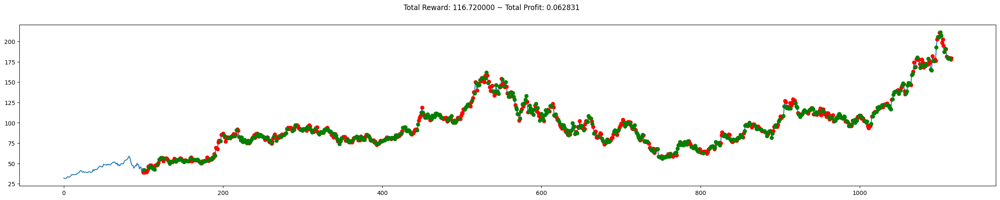

100%|██████████| 10/10 [04:47<00:00, 28.74s/it]


In [138]:
evla_custom_model(env_test, actor)

## Increasing No of LSTM Units

### Defining Custom Model - Increasing No of LSTM Units

In [139]:
## Actor Network
inputs = Input(shape=(None, signal_features_train.shape[-1]))
lstm = LSTM(512, return_sequences=True)(inputs)
dense = Dense(1024, activation='relu')(lstm)
logits = Dense(env_train.action_space.n, activation='sigmoid')(dense)
actor = Model(inputs=inputs, outputs=logits)

## Critic Network
inputs = Input(shape=(None, signal_features_train.shape[-1]))
lstm = LSTM(512, return_sequences=True)(inputs)
dense = Dense(1024, activation='relu')(lstm)
values = Dense(1, activation='relu')(dense)
critic = Model(inputs=inputs, outputs=values)

## PPO Algorithm
optimizer = tf.keras.optimizers.Adam(learning_rate=0.001)
huber_loss = tf.keras.losses.Huber()
entropy_loss = tf.keras.losses.CategoricalCrossentropy(from_logits=True)

### Training Custom Model

In [140]:
train_ppo(env_train, actor, critic, num_episodes=25)

  4%|▍         | 1/25 [00:24<09:51, 24.65s/it]

Episode: 0, Total Reward: 28.47000000000004, loss: -0.09411890804767609


  8%|▊         | 2/25 [00:49<09:31, 24.85s/it]

Episode: 1, Total Reward: 19.079999999999988, loss: 0.06701301038265228


 12%|█▏        | 3/25 [01:12<08:49, 24.08s/it]

Episode: 2, Total Reward: 13.730000000000018, loss: 0.05429746210575104


 16%|█▌        | 4/25 [01:36<08:19, 23.77s/it]

Episode: 3, Total Reward: 15.259999999999994, loss: 0.039841651916503906


 20%|██        | 5/25 [01:58<07:44, 23.24s/it]

Episode: 4, Total Reward: 15.349999999999945, loss: 0.10965099930763245


 24%|██▍       | 6/25 [02:23<07:34, 23.90s/it]

Episode: 5, Total Reward: -0.8000000000000327, loss: 0.2526156008243561


 28%|██▊       | 7/25 [02:53<07:47, 25.96s/it]

Episode: 6, Total Reward: 28.340000000000018, loss: -0.03241872787475586


 32%|███▏      | 8/25 [03:23<07:38, 27.00s/it]

Episode: 7, Total Reward: 16.530000000000022, loss: 0.10128119587898254


 36%|███▌      | 9/25 [03:54<07:32, 28.29s/it]

Episode: 8, Total Reward: 1.8200000000000003, loss: 0.20321567356586456


 40%|████      | 10/25 [04:25<07:18, 29.26s/it]

Episode: 9, Total Reward: 17.79000000000001, loss: 0.051433756947517395


 44%|████▍     | 11/25 [04:49<06:27, 27.68s/it]

Episode: 10, Total Reward: 30.809999999999995, loss: -0.09394463896751404


 48%|████▊     | 12/25 [05:13<05:45, 26.60s/it]

Episode: 11, Total Reward: 25.64000000000005, loss: -0.03636792302131653


 52%|█████▏    | 13/25 [05:37<05:08, 25.74s/it]

Episode: 12, Total Reward: 6.809999999999977, loss: 0.19987542927265167


 56%|█████▌    | 14/25 [06:09<05:04, 27.69s/it]

Episode: 13, Total Reward: 5.819999999999972, loss: 0.18191736936569214


 60%|██████    | 15/25 [06:40<04:46, 28.68s/it]

Episode: 14, Total Reward: 11.839999999999986, loss: 0.06330010294914246


 64%|██████▍   | 16/25 [07:10<04:22, 29.12s/it]

Episode: 15, Total Reward: 12.82999999999997, loss: 0.08992750942707062


 68%|██████▊   | 17/25 [07:41<03:55, 29.47s/it]

Episode: 16, Total Reward: 1.3899999999999864, loss: 0.2826076149940491


 72%|███████▏  | 18/25 [08:12<03:29, 29.97s/it]

Episode: 17, Total Reward: 25.670000000000023, loss: -0.10982626676559448


 76%|███████▌  | 19/25 [08:42<03:00, 30.10s/it]

Episode: 18, Total Reward: 19.549999999999983, loss: 0.04639166593551636


 80%|████████  | 20/25 [09:13<02:31, 30.32s/it]

Episode: 19, Total Reward: 12.559999999999988, loss: 0.07951635122299194


 84%|████████▍ | 21/25 [09:45<02:02, 30.74s/it]

Episode: 20, Total Reward: 30.84000000000004, loss: -0.1372380554676056


 88%|████████▊ | 22/25 [10:13<01:29, 29.89s/it]

Episode: 21, Total Reward: -0.7600000000000122, loss: 0.2607620358467102


 92%|█████████▏| 23/25 [10:37<00:56, 28.14s/it]

Episode: 22, Total Reward: 13.720000000000002, loss: 0.08506743609905243


 96%|█████████▌| 24/25 [11:00<00:26, 26.73s/it]

Episode: 23, Total Reward: 6.820000000000006, loss: 0.1967308521270752


100%|██████████| 25/25 [11:24<00:00, 27.40s/it]

Episode: 24, Total Reward: 14.969999999999978, loss: 0.08098675310611725
total_reward:  [28.47000000000004, 19.079999999999988, 13.730000000000018, 15.259999999999994, 15.349999999999945, -0.8000000000000327, 28.340000000000018, 16.530000000000022, 1.8200000000000003, 17.79000000000001, 30.809999999999995, 25.64000000000005, 6.809999999999977, 5.819999999999972, 11.839999999999986, 12.82999999999997, 1.3899999999999864, 25.670000000000023, 19.549999999999983, 12.559999999999988, 30.84000000000004, -0.7600000000000122, 13.720000000000002, 6.820000000000006, 14.969999999999978]


### Testing Custom Model

  0%|          | 0/10 [00:00<?, ?it/s]

Total reward accumulated during the test: 96.87999999999987


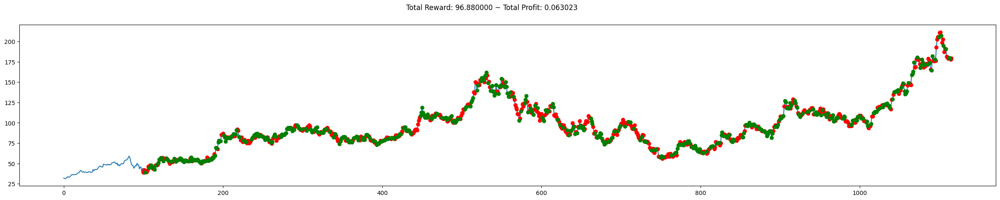

 10%|█         | 1/10 [00:08<01:15,  8.39s/it]

Total reward accumulated during the test: 8.960000000000164


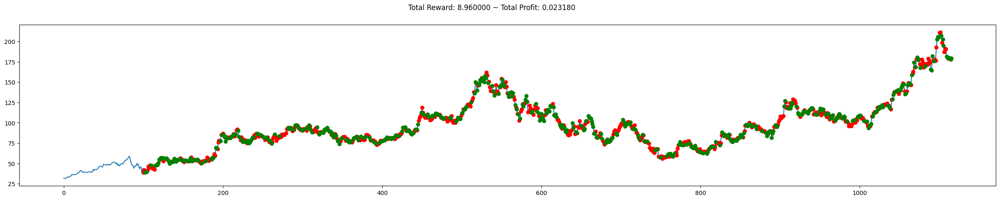

 20%|██        | 2/10 [00:16<01:07,  8.50s/it]

Total reward accumulated during the test: 82.96000000000008


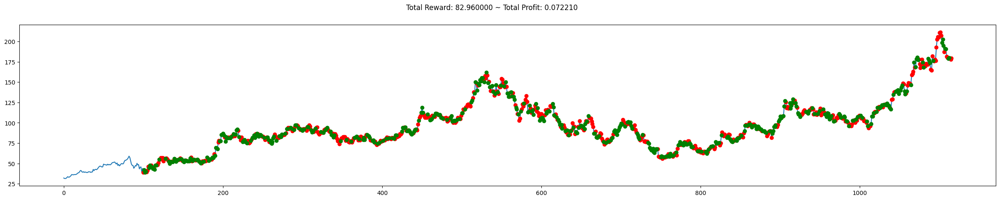

 30%|███       | 3/10 [00:25<00:58,  8.36s/it]

Total reward accumulated during the test: 24.150000000000034


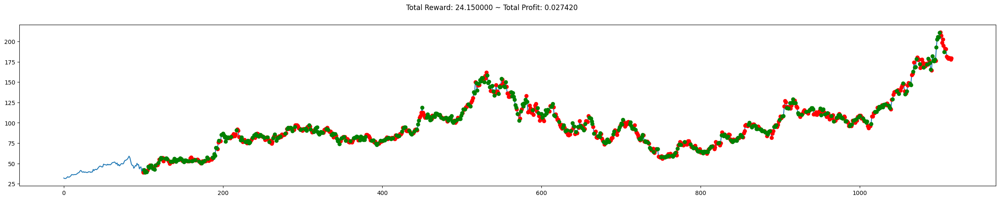

 40%|████      | 4/10 [00:33<00:50,  8.48s/it]

Total reward accumulated during the test: 4.590000000000117


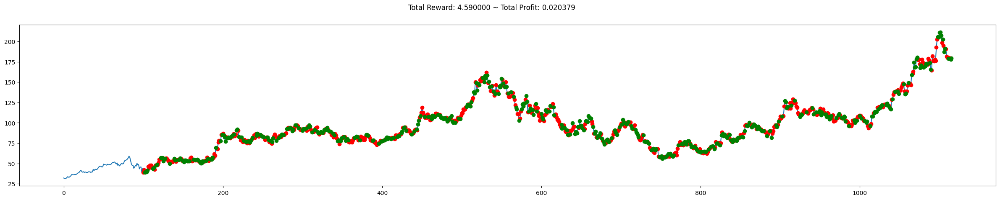

 50%|█████     | 5/10 [00:42<00:42,  8.50s/it]

Total reward accumulated during the test: 147.93000000000026


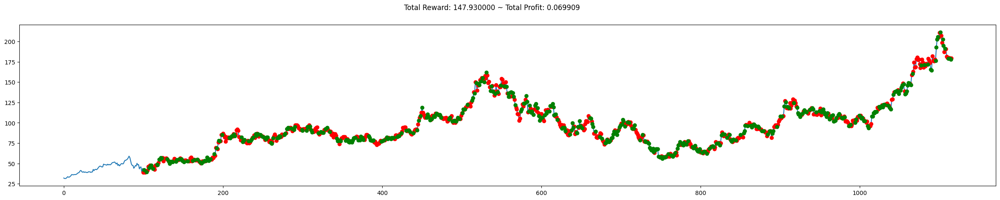

 60%|██████    | 6/10 [00:50<00:34,  8.52s/it]

Total reward accumulated during the test: 55.350000000000136


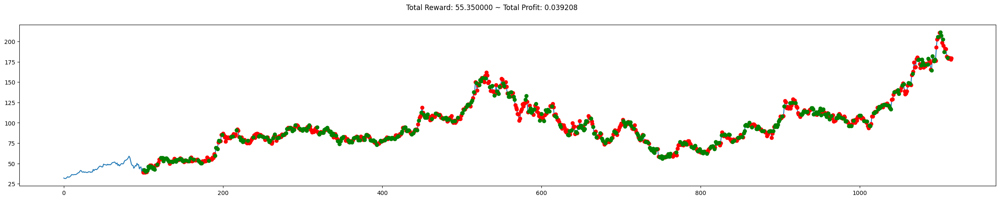

 70%|███████   | 7/10 [00:59<00:25,  8.43s/it]

Total reward accumulated during the test: -14.140000000000015


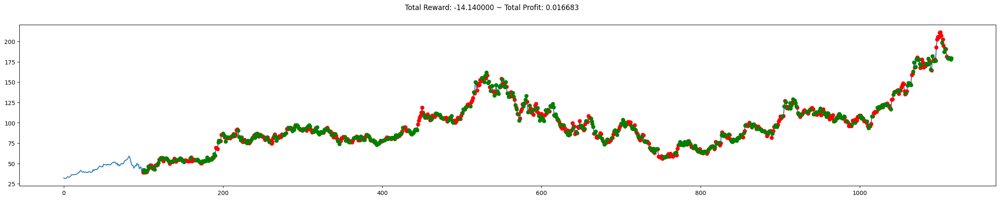

 80%|████████  | 8/10 [01:07<00:16,  8.48s/it]

Total reward accumulated during the test: 70.39999999999998


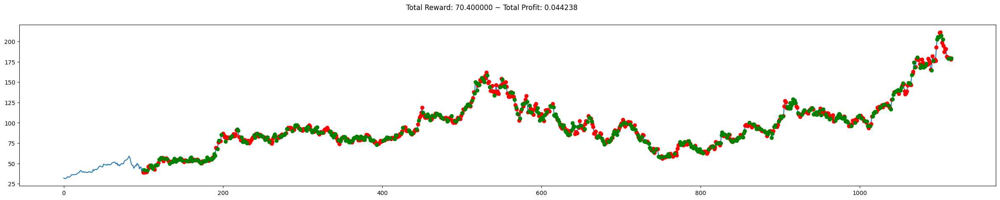

 90%|█████████ | 9/10 [01:15<00:08,  8.36s/it]

Total reward accumulated during the test: 32.970000000000006


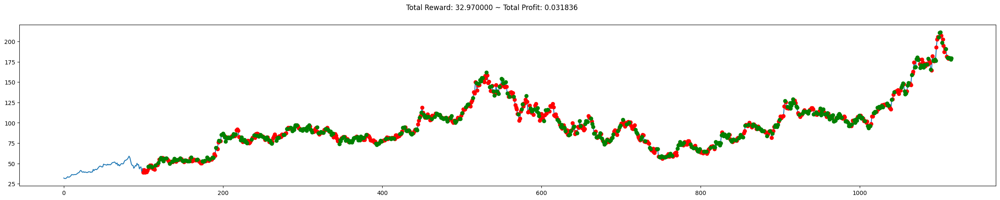

100%|██████████| 10/10 [01:24<00:00,  8.43s/it]


In [141]:
evla_custom_model(env_test, actor)

## Training the model shorter duration (epoch = 5)

### Defining Custom Model - shorter training duration

In [142]:
inputs = Input(shape=(None, signal_features_train.shape[-1]))
lstm = LSTM(128, return_sequences=True)(inputs)
lstm = LSTM(256, return_sequences=True)(lstm)
dense = Dense(256, activation='relu')(lstm)
dense = Dense(128, activation='relu')(dense)
dense = Dense(128, activation='relu')(dense)
logits = Dense(env_train.action_space.n, activation='sigmoid')(dense)
actor = Model(inputs=inputs, outputs=logits)

## Critic Network
inputs = Input(shape=(None, signal_features_train.shape[-1]))
lstm = LSTM(128, return_sequences=True)(inputs)
lstm = LSTM(256, return_sequences=True)(lstm)
dense = Dense(256, activation='relu')(lstm)
dense = Dense(128, activation='relu')(dense)
dense = Dense(128, activation='relu')(dense)
values = Dense(1, activation='sigmoid')(dense)
critic = Model(inputs=inputs, outputs=values)

## PPO Algorithm
optimizer = tf.keras.optimizers.Adam(learning_rate=0.001)
huber_loss = tf.keras.losses.Huber()
entropy_loss = tf.keras.losses.CategoricalCrossentropy(from_logits=True)

### Training Custom Model

In [143]:
train_ppo(env_train, actor, critic, num_episodes=5)

 20%|██        | 1/5 [00:44<02:56, 44.04s/it]

Episode: 0, Total Reward: 9.949999999999989, loss: 0.15821464359760284


 40%|████      | 2/5 [01:27<02:11, 43.77s/it]

Episode: 1, Total Reward: 20.330000000000005, loss: 0.07771502435207367


 60%|██████    | 3/5 [02:11<01:27, 43.62s/it]

Episode: 2, Total Reward: 28.839999999999968, loss: 0.06454887986183167


 80%|████████  | 4/5 [02:55<00:44, 44.06s/it]

Episode: 3, Total Reward: -1.1799999999999926, loss: 0.33935704827308655


100%|██████████| 5/5 [03:40<00:00, 44.03s/it]

Episode: 4, Total Reward: 23.859999999999985, loss: 0.03213486075401306
total_reward:  [9.949999999999989, 20.330000000000005, 28.839999999999968, -1.1799999999999926, 23.859999999999985]


### Testing Custom Model

  0%|          | 0/10 [00:00<?, ?it/s]

Total reward accumulated during the test: -18.36999999999989


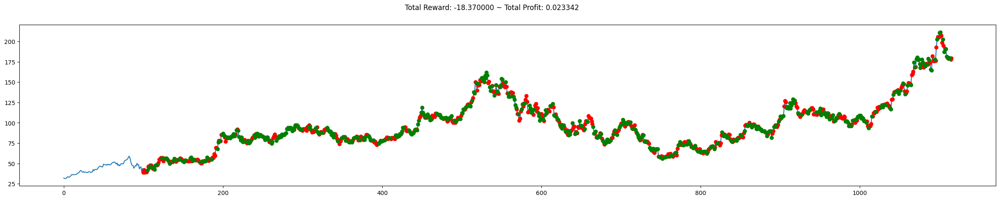

 10%|█         | 1/10 [00:15<02:23, 15.95s/it]

Total reward accumulated during the test: 76.45000000000005


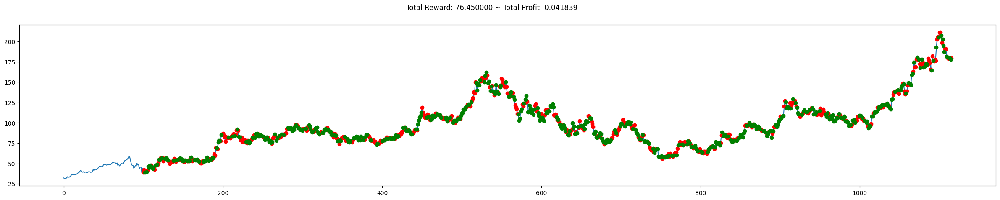

 20%|██        | 2/10 [00:31<02:04, 15.55s/it]

Total reward accumulated during the test: 45.77999999999998


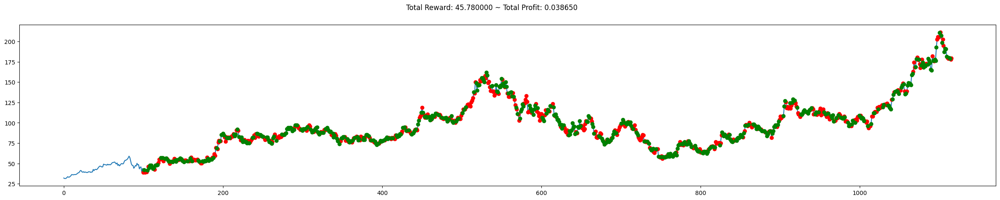

 30%|███       | 3/10 [00:47<01:49, 15.68s/it]

Total reward accumulated during the test: 174.54000000000005


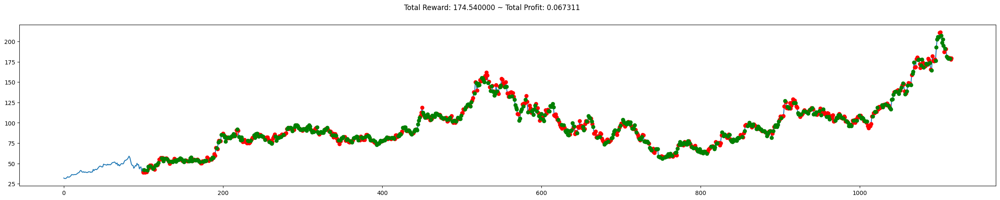

 40%|████      | 4/10 [01:02<01:33, 15.66s/it]

Total reward accumulated during the test: 78.83000000000004


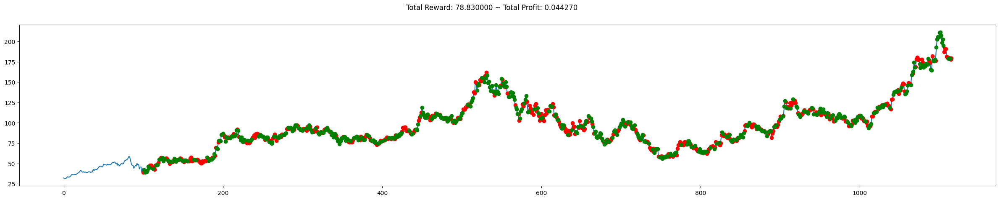

 50%|█████     | 5/10 [01:18<01:18, 15.75s/it]

Total reward accumulated during the test: 20.989999999999974


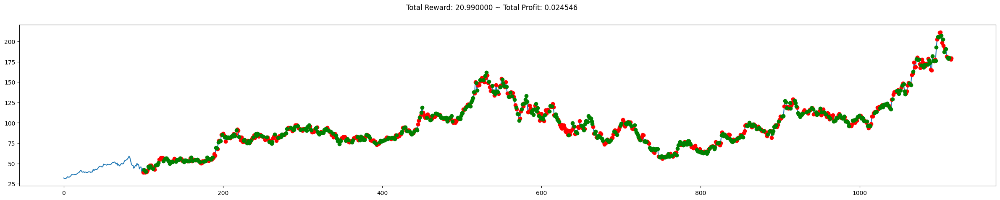

 60%|██████    | 6/10 [01:34<01:03, 15.84s/it]

Total reward accumulated during the test: 43.34000000000005


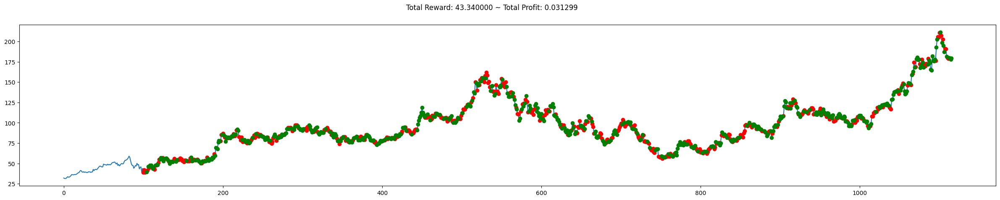

 70%|███████   | 7/10 [01:50<00:47, 15.89s/it]

Total reward accumulated during the test: 45.52000000000014


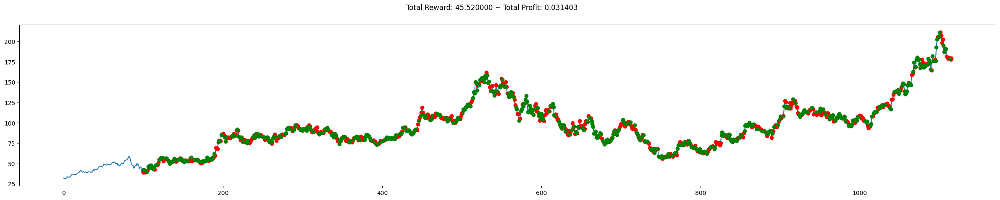

 80%|████████  | 8/10 [02:06<00:31, 15.92s/it]

Total reward accumulated during the test: 107.75000000000003


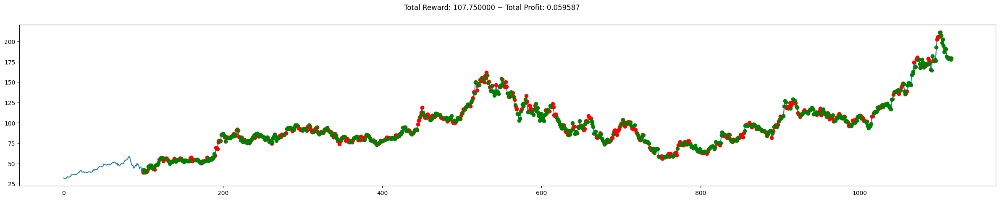

 90%|█████████ | 9/10 [02:22<00:15, 15.91s/it]

Total reward accumulated during the test: 35.91999999999999


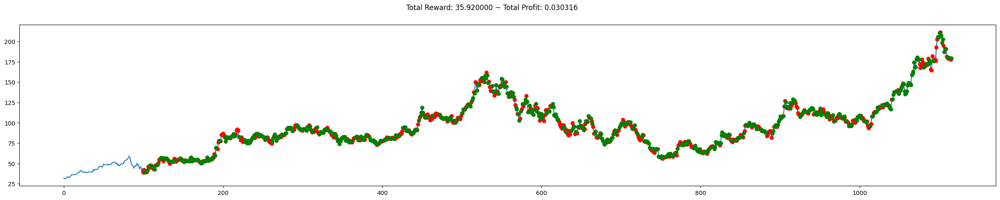

100%|██████████| 10/10 [02:38<00:00, 15.81s/it]


In [144]:
evla_custom_model(env_test, actor)

## Training the model longer duration (epoch = 50)

### Defining Custom Model - longer training duration

In [145]:
## Actor Network
inputs = Input(shape=(None, signal_features_train.shape[-1]))
lstm = LSTM(128, return_sequences=True)(inputs)
lstm = LSTM(256, return_sequences=True)(lstm)
dense = Dense(256, activation='relu')(lstm)
dense = Dense(128, activation='relu')(dense)
dense = Dense(128, activation='relu')(dense)
logits = Dense(env_train.action_space.n, activation='sigmoid')(dense)
actor = Model(inputs=inputs, outputs=logits)

## Critic Network
inputs = Input(shape=(None, signal_features_train.shape[-1]))
lstm = LSTM(128, return_sequences=True)(inputs)
lstm = LSTM(256, return_sequences=True)(lstm)
dense = Dense(256, activation='relu')(lstm)
dense = Dense(128, activation='relu')(dense)
dense = Dense(128, activation='relu')(dense)
values = Dense(1, activation='sigmoid')(dense)
critic = Model(inputs=inputs, outputs=values)

## PPO Algorithm
optimizer = tf.keras.optimizers.Adam(learning_rate=0.001)
huber_loss = tf.keras.losses.Huber()
entropy_loss = tf.keras.losses.CategoricalCrossentropy(from_logits=True)

### Training Custom Model

In [146]:
train_ppo(env_train, actor, critic, num_episodes=50)

  2%|▏         | 1/50 [00:48<39:15, 48.07s/it]

Episode: 0, Total Reward: 25.599999999999998, loss: -0.00783643126487732


  4%|▍         | 2/50 [01:41<40:59, 51.23s/it]

Episode: 1, Total Reward: 8.05, loss: 0.2207707017660141


  6%|▌         | 3/50 [02:35<41:09, 52.53s/it]

Episode: 2, Total Reward: 40.629999999999995, loss: -0.16695354878902435


  8%|▊         | 4/50 [03:27<40:00, 52.17s/it]

Episode: 3, Total Reward: 7.16999999999998, loss: 0.3066736161708832


 10%|█         | 5/50 [04:21<39:33, 52.75s/it]

Episode: 4, Total Reward: 22.549999999999965, loss: 0.06143005192279816


 12%|█▏        | 6/50 [05:16<39:23, 53.71s/it]

Episode: 5, Total Reward: 14.630000000000013, loss: 0.15441027283668518


 14%|█▍        | 7/50 [06:12<38:58, 54.39s/it]

Episode: 6, Total Reward: 9.44999999999997, loss: 0.192130908370018


 16%|█▌        | 8/50 [07:06<38:07, 54.45s/it]

Episode: 7, Total Reward: 7.439999999999966, loss: 0.2773682475090027


 18%|█▊        | 9/50 [07:58<36:32, 53.48s/it]

Episode: 8, Total Reward: 36.55, loss: -0.053530871868133545


 20%|██        | 10/50 [08:43<33:51, 50.80s/it]

Episode: 9, Total Reward: 18.81999999999998, loss: 0.16201254725456238


 22%|██▏       | 11/50 [09:27<31:39, 48.72s/it]

Episode: 10, Total Reward: 7.349999999999966, loss: 0.30855053663253784


 24%|██▍       | 12/50 [10:10<29:54, 47.22s/it]

Episode: 11, Total Reward: -5.970000000000005, loss: 0.37440353631973267


 26%|██▌       | 13/50 [10:54<28:28, 46.17s/it]

Episode: 12, Total Reward: 24.800000000000068, loss: 0.10538403689861298


 28%|██▊       | 14/50 [11:38<27:20, 45.58s/it]

Episode: 13, Total Reward: 6.489999999999974, loss: 0.22715210914611816


 30%|███       | 15/50 [12:22<26:18, 45.11s/it]

Episode: 14, Total Reward: 20.279999999999983, loss: 0.09647822380065918


 32%|███▏      | 16/50 [13:06<25:18, 44.66s/it]

Episode: 15, Total Reward: 2.659999999999993, loss: 0.35118335485458374


 34%|███▍      | 17/50 [13:50<24:24, 44.38s/it]

Episode: 16, Total Reward: 8.31000000000001, loss: 0.27988144755363464


 36%|███▌      | 18/50 [14:33<23:31, 44.11s/it]

Episode: 17, Total Reward: 16.340000000000018, loss: 0.08599323034286499


 38%|███▊      | 19/50 [15:17<22:44, 44.02s/it]

Episode: 18, Total Reward: 3.199999999999953, loss: 0.31542620062828064


 40%|████      | 20/50 [16:01<22:04, 44.15s/it]

Episode: 19, Total Reward: 48.43000000000004, loss: -0.23785659670829773


 42%|████▏     | 21/50 [16:45<21:17, 44.05s/it]

Episode: 20, Total Reward: 29.599999999999984, loss: -0.018944159150123596


 44%|████▍     | 22/50 [17:29<20:34, 44.07s/it]

Episode: 21, Total Reward: 20.489999999999974, loss: 0.07638457417488098


 46%|████▌     | 23/50 [18:13<19:49, 44.07s/it]

Episode: 22, Total Reward: 30.629999999999946, loss: -0.012970149517059326


 48%|████▊     | 24/50 [18:57<19:05, 44.04s/it]

Episode: 23, Total Reward: 34.45000000000001, loss: -0.04753077030181885


 50%|█████     | 25/50 [19:41<18:19, 43.99s/it]

Episode: 24, Total Reward: 18.61000000000002, loss: 0.1361919343471527


 52%|█████▏    | 26/50 [20:25<17:36, 44.02s/it]

Episode: 25, Total Reward: 21.460000000000022, loss: 0.12368088960647583


 54%|█████▍    | 27/50 [21:09<16:49, 43.91s/it]

Episode: 26, Total Reward: 23.39999999999999, loss: 0.08201132714748383


 56%|█████▌    | 28/50 [21:53<16:07, 43.97s/it]

Episode: 27, Total Reward: 28.289999999999992, loss: 0.05377897620201111


 58%|█████▊    | 29/50 [22:37<15:20, 43.84s/it]

Episode: 28, Total Reward: 11.29, loss: 0.14082956314086914


 60%|██████    | 30/50 [23:21<14:37, 43.86s/it]

Episode: 29, Total Reward: 35.57, loss: -0.08597671985626221


 62%|██████▏   | 31/50 [24:04<13:51, 43.74s/it]

Episode: 30, Total Reward: 8.899999999999967, loss: 0.2660166025161743


 64%|██████▍   | 32/50 [24:48<13:07, 43.76s/it]

Episode: 31, Total Reward: 22.719999999999985, loss: 0.06149040162563324


 66%|██████▌   | 33/50 [25:31<12:22, 43.66s/it]

Episode: 32, Total Reward: 28.68, loss: 0.037950724363327026


 68%|██████▊   | 34/50 [26:15<11:39, 43.70s/it]

Episode: 33, Total Reward: 32.05000000000001, loss: -0.055537283420562744


 70%|███████   | 35/50 [26:59<10:55, 43.67s/it]

Episode: 34, Total Reward: 18.42, loss: 0.04181015491485596


 72%|███████▏  | 36/50 [27:43<10:12, 43.74s/it]

Episode: 35, Total Reward: 14.779999999999976, loss: 0.1249583289027214


 74%|███████▍  | 37/50 [28:26<09:29, 43.78s/it]

Episode: 36, Total Reward: -12.170000000000002, loss: 0.4748573303222656


 76%|███████▌  | 38/50 [29:10<08:45, 43.76s/it]

Episode: 37, Total Reward: 7.150000000000009, loss: 0.22862695157527924


 78%|███████▊  | 39/50 [29:54<08:00, 43.70s/it]

Episode: 38, Total Reward: 12.029999999999987, loss: 0.21865983307361603


 80%|████████  | 40/50 [30:37<07:17, 43.71s/it]

Episode: 39, Total Reward: 23.96000000000001, loss: 0.061457887291908264


 82%|████████▏ | 41/50 [31:21<06:32, 43.64s/it]

Episode: 40, Total Reward: 28.880000000000017, loss: -0.01742774248123169


 84%|████████▍ | 42/50 [32:05<05:50, 43.82s/it]

Episode: 41, Total Reward: 34.18999999999997, loss: -0.10986514389514923


 86%|████████▌ | 43/50 [32:49<05:06, 43.79s/it]

Episode: 42, Total Reward: -2.6099999999999923, loss: 0.40746647119522095


 88%|████████▊ | 44/50 [33:32<04:22, 43.73s/it]

Episode: 43, Total Reward: 25.090000000000014, loss: -0.026605769991874695


 90%|█████████ | 45/50 [34:16<03:39, 43.81s/it]

Episode: 44, Total Reward: 2.6400000000000077, loss: 0.2792090177536011


 92%|█████████▏| 46/50 [35:01<02:55, 43.88s/it]

Episode: 45, Total Reward: 3.4100000000000286, loss: 0.29620686173439026


 94%|█████████▍| 47/50 [35:44<02:11, 43.90s/it]

Episode: 46, Total Reward: 23.580000000000005, loss: 0.0041944533586502075


 96%|█████████▌| 48/50 [36:29<01:28, 44.17s/it]

Episode: 47, Total Reward: -6.360000000000024, loss: 0.44216394424438477


 98%|█████████▊| 49/50 [37:13<00:44, 44.06s/it]

Episode: 48, Total Reward: 17.890000000000022, loss: 0.058872416615486145


100%|██████████| 50/50 [37:58<00:00, 45.57s/it]

Episode: 49, Total Reward: 37.45000000000001, loss: -0.08117291331291199
total_reward:  [25.599999999999998, 8.05, 40.629999999999995, 7.16999999999998, 22.549999999999965, 14.630000000000013, 9.44999999999997, 7.439999999999966, 36.55, 18.81999999999998, 7.349999999999966, -5.970000000000005, 24.800000000000068, 6.489999999999974, 20.279999999999983, 2.659999999999993, 8.31000000000001, 16.340000000000018, 3.199999999999953, 48.43000000000004, 29.599999999999984, 20.489999999999974, 30.629999999999946, 34.45000000000001, 18.61000000000002, 21.460000000000022, 23.39999999999999, 28.289999999999992, 11.29, 35.57, 8.899999999999967, 22.719999999999985, 28.68, 32.05000000000001, 18.42, 14.779999999999976, -12.170000000000002, 7.150000000000009, 12.029999999999987, 23.96000000000001, 28.880000000000017, 34.18999999999997, -2.6099999999999923, 25.090000000000014, 2.6400000000000077, 3.4100000000000286, 23.580000000000005, -6.360000000000024, 17.890000000000022, 37.45000000000001]


### Testing Custom Model

  0%|          | 0/10 [00:00<?, ?it/s]

Total reward accumulated during the test: 37.34999999999998


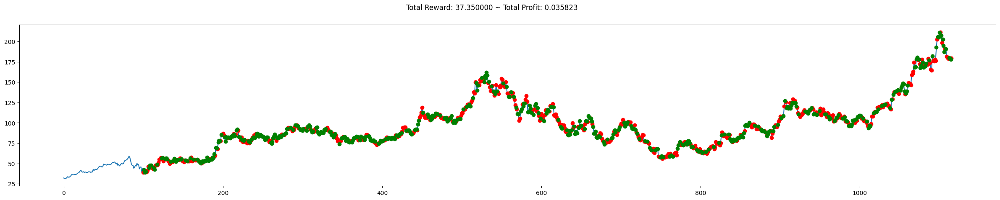

 10%|█         | 1/10 [00:15<02:23, 15.99s/it]

Total reward accumulated during the test: 63.239999999999895


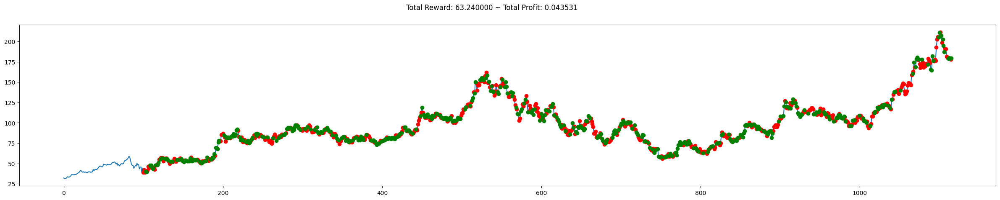

 20%|██        | 2/10 [00:31<02:06, 15.76s/it]

Total reward accumulated during the test: 94.31999999999991


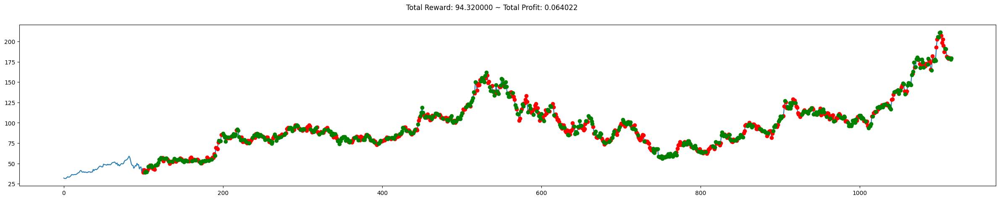

 30%|███       | 3/10 [00:47<01:50, 15.79s/it]

Total reward accumulated during the test: 42.28999999999995


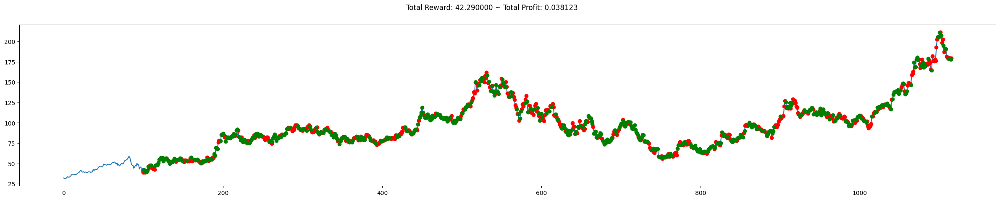

 40%|████      | 4/10 [01:03<01:34, 15.78s/it]

Total reward accumulated during the test: -49.08999999999999


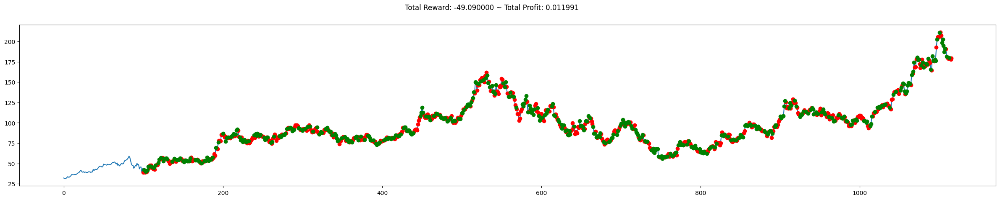

 50%|█████     | 5/10 [01:19<01:19, 15.85s/it]

Total reward accumulated during the test: -64.19000000000008


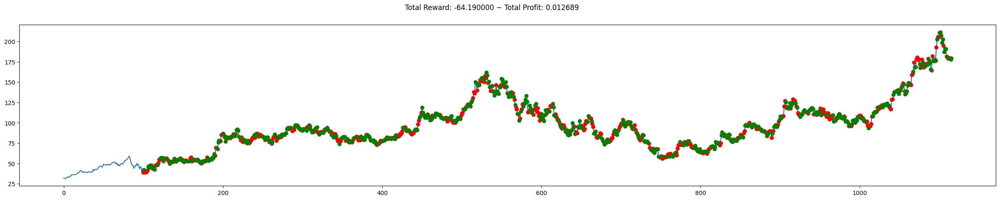

 60%|██████    | 6/10 [01:35<01:03, 15.89s/it]

Total reward accumulated during the test: 15.860000000000106


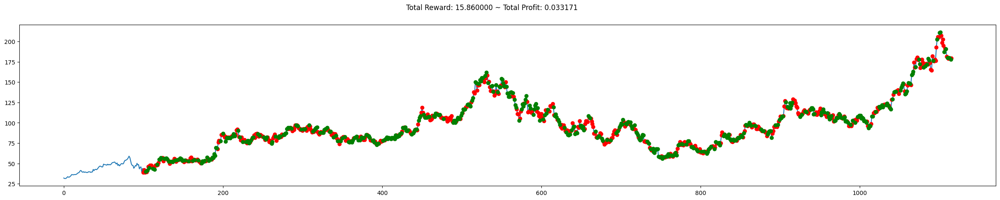

 70%|███████   | 7/10 [01:50<00:47, 15.83s/it]

Total reward accumulated during the test: 120.89000000000004


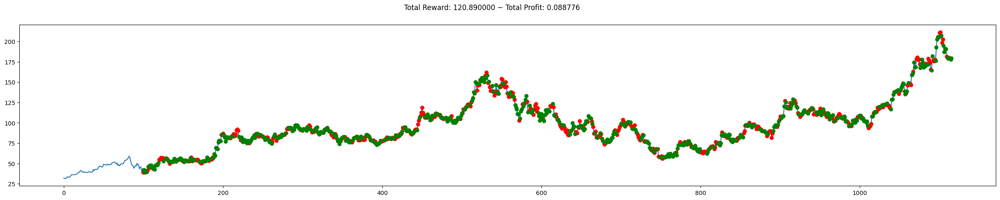

 80%|████████  | 8/10 [02:06<00:31, 15.78s/it]

Total reward accumulated during the test: 57.41999999999996


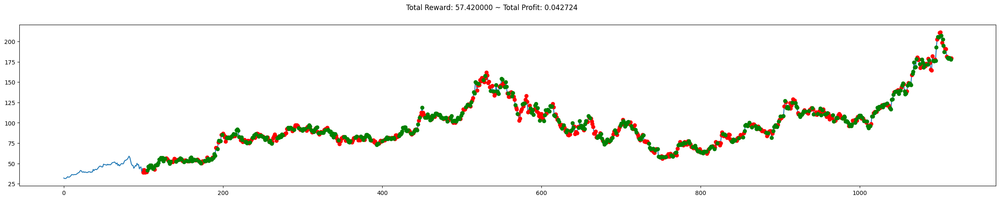

 90%|█████████ | 9/10 [02:22<00:15, 15.83s/it]

Total reward accumulated during the test: 47.32000000000011


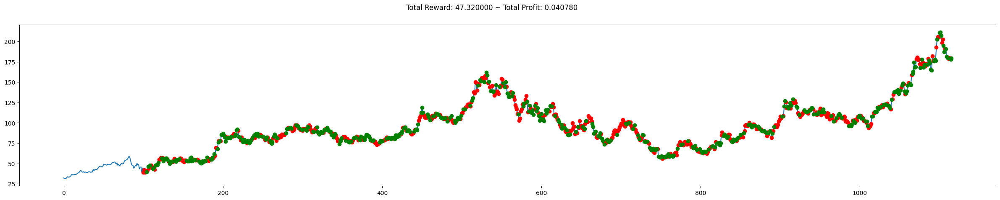

100%|██████████| 10/10 [02:38<00:00, 15.85s/it]


In [147]:
evla_custom_model(env_test, actor)